# [CS 6476 Project 2: Local Feature Matching](https://www.cc.gatech.edu/~hays/compvision/proj2/)

This iPython notebook:  
(1) Loads and resizes images  
(2) Finds interest points in those images                 (you code this)  
(3) Describes each interest point with a local feature    (you code this)  
(4) Finds matching features                               (you code this)  
(5) Visualizes the matches  
(6) Evaluates the matches based on ground truth correspondences  

## Setup

In [1]:
from SID12012109_harris import get_interest_points
from SID12012109_sift import get_features
%matplotlib inline
# %matplotlib notebook
%load_ext autoreload
%autoreload 2
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utils import *
from SID12012109_feature_matching import match_features
from IPython.core.debugger import set_trace

# Notre Dame
image1 = load_image('../data/Notre Dame/921919841_a30df938f2_o.jpg')
image2 = load_image('../data/Notre Dame/4191453057_c86028ce1f_o.jpg')
eval_file = '../data/Notre Dame/921919841_a30df938f2_o_to_4191453057_c86028ce1f_o.pkl'
# eval_file ='../eval_file.pkl'

# # Mount Rushmore -- this pair is relatively easy (still harder than Notre Dame, though)
# image1 = load_image('../data/Mount Rushmore/9021235130_7c2acd9554_o.jpg')
# image2 = load_image('../data/Mount Rushmore/9318872612_a255c874fb_o.jpg')
# eval_file = '../data/Mount Rushmore/9021235130_7c2acd9554_o_to_9318872612_a255c874fb_o.pkl'

# # Episcopal Gaudi -- This pair is relatively difficult
# image1 = load_image('../data/Episcopal Gaudi/4386465943_8cf9776378_o.jpg')
# image2 = load_image('../data/Episcopal Gaudi/3743214471_1b5bbfda98_o.jpg')
# eval_file = '../data/Episcopal Gaudi/4386465943_8cf9776378_o_to_3743214471_1b5bbfda98_o.pkl'

                    
scale_factor = 0.5
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

feature_width = 16 # width and height of each local feature, in pixels. 
image1_bw.shape



(1024, 768)

## Find distinctive points in each image (Szeliski 4.1.1)

1280.0
[1.28e+03 1.60e+01 1.00e+00 ... 1.00e+00 1.00e+00 1.00e+00]
[4094 5133 5132 ...  155   12    0]
1270.0
[1.27000000e+03 1.40000000e+01 4.79493483e+02 ... 1.00000000e+00
 1.00000000e+00 1.00000000e+00]
[4908 6187 6183 ...    2   24    0]
1500 corners in image 1, 1500 corners in image 2


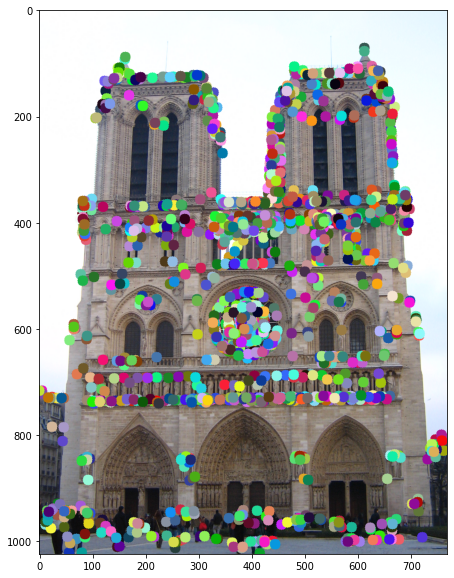

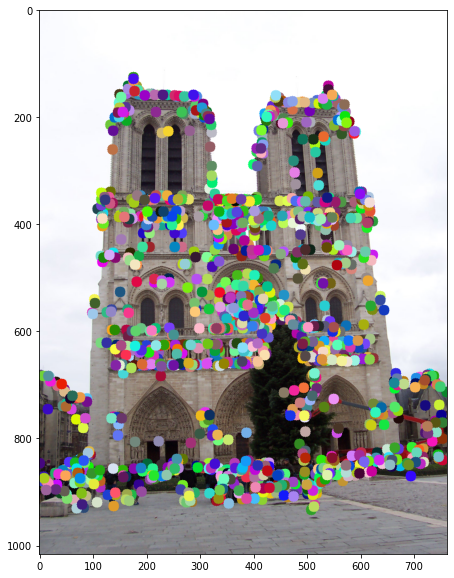

In [10]:
x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10,10))
plt.imshow(c1)
plt.figure(figsize=(10,10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


## Create feature vectors at each interest point (Szeliski 4.1.2)

In [11]:
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)

(768, 1024)
(762, 1016)


## Match features (Szeliski 4.1.3)

In [12]:
matches, confidences = match_features(image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))

(170, 1)
(170, 2)
170 matches from 1500 corners


## Visualization

You might want to set 'num_pts_to_visualize' and 'num_pts_to_evaluate' to some constant (e.g. 100) once you start detecting hundreds of interest points, otherwise things might get too cluttered. You could also threshold based on confidence.  
  
There are two visualization functions below. You can comment out one of both of them if you prefer.

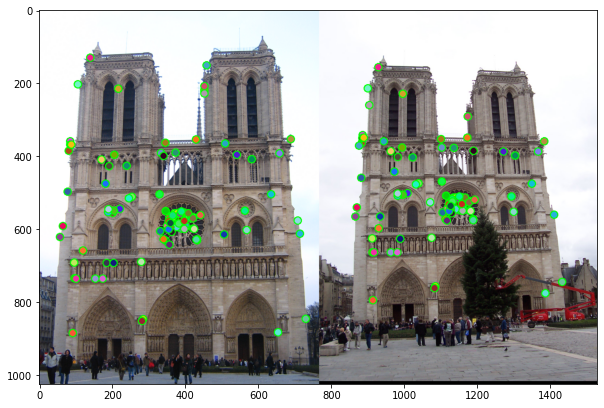

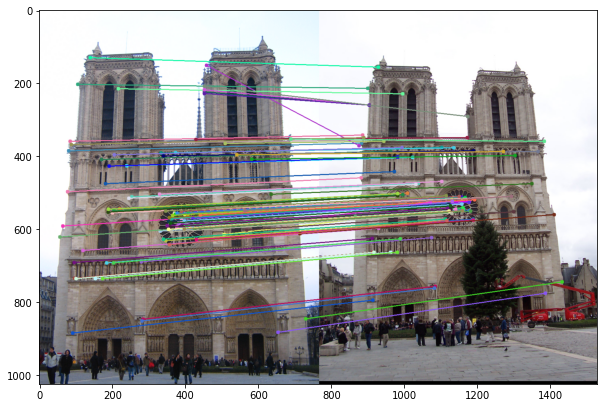

In [43]:
from utils import show_correspondence_circles,show_correspondence_lines
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                    x1[matches[:num_pts_to_visualize, 0]], y1[matches[:num_pts_to_visualize, 0]],
                    x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10,10)); plt.imshow(c1)
plt.savefig('../results/vis_circles.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                    x1[matches[:num_pts_to_visualize, 0]], y1[matches[:num_pts_to_visualize, 0]],
                    x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10,10)); plt.imshow(c2)
plt.savefig('../results/vis_lines.jpg', dpi=1000)

Comment out the function below if you are not testing on the Notre Dame, Episcopal Gaudi, and Mount Rushmore image pairs--this evaluation function will only work for those which have ground truth available.  
  
You can use `annotate_correspondences/collect_ground_truth_corr.py` to build the ground truth for other image pairs if you want, but it's very tedious. It would be a great service to the class for future years, though!

Correct
Correct
Correct
Correct
Correct
Correct
Correct
Incorrect
Correct
Correct
Correct
Correct
Correct
Correct
Incorrect
Correct
Incorrect
Correct
Correct
Correct
Correct
Incorrect
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Incorrect
Correct
Correct
Incorrect
Incorrect
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Incorrect
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Incorrect
Correct
Correct
Correct
Correct
Incorrect
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Incorrect
Correct
Correct
Correct
Correct
Correct
Correct
Incorrect
Correct
Incorrect
Correct
Correct
Correct
Incorrect
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Incorrect
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Correct
Correct
You found 100/100 required matches
Accuracy = 0.850000


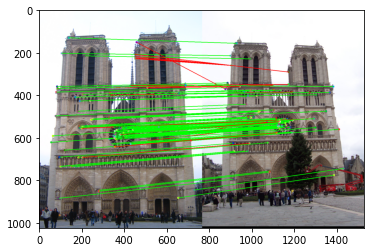

In [13]:
# num_pts_to_evaluate = len(matches)
num_pts_to_evaluate = 100
_, c = evaluate_correspondence(image1, image2, eval_file, scale_factor,
                        x1[matches[:num_pts_to_evaluate, 0]], y1[matches[:num_pts_to_evaluate, 0]],
                        x2[matches[:num_pts_to_evaluate, 1]], y2[matches[:num_pts_to_evaluate, 1]])
plt.figure(); plt.imshow(c)
plt.savefig('../results/eval.jpg', dpi=1000)

## More examples

### Mount Rushmore

647.800123494894
[647.80012349   1.         147.82760229 ...   2.           1.
   1.        ]
[3285 4116 4115 ...    2   13    0]
703.600028425241
[703.60002843   1.          72.73238618 ...   1.           1.
   3.        ]
[7437 9608 9609 ...   15   56    0]
1500 corners in image 1, 1500 corners in image 2


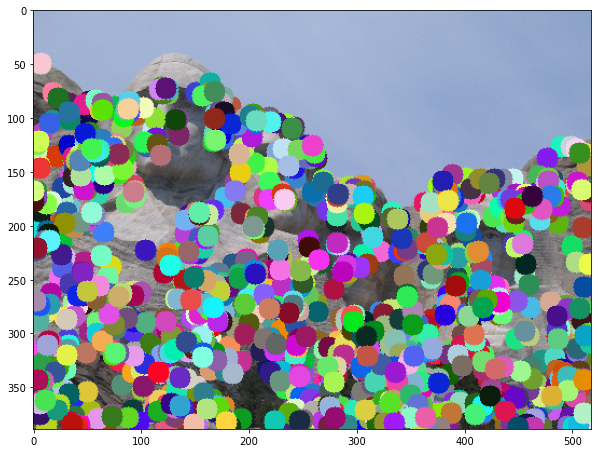

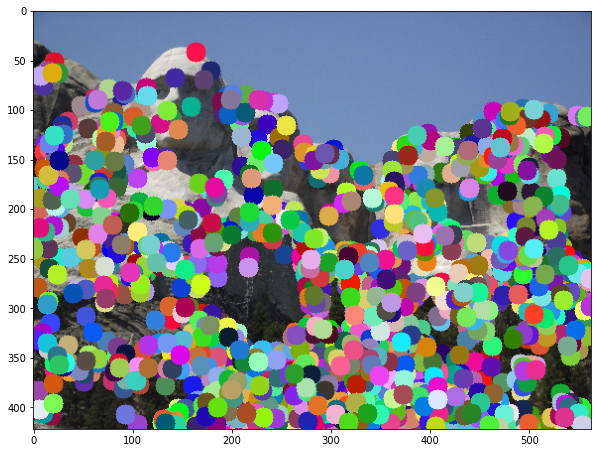

In [45]:
image1 = load_image('../data/Mount Rushmore/9021235130_7c2acd9554_o.jpg')
image2 = load_image('../data/Mount Rushmore/9318872612_a255c874fb_o.jpg')
scale_factor = 0.2
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


In [46]:
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))


(518, 389)
(563, 422)
(164, 1)
(164, 2)
164 matches from 1500 corners


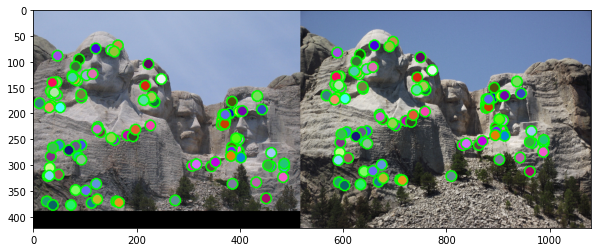

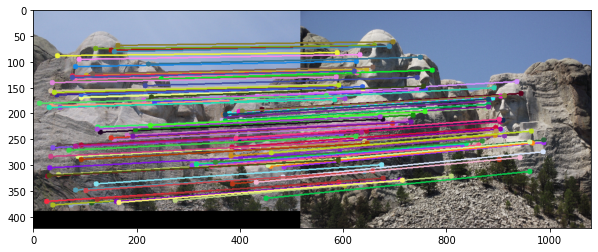

In [47]:
from utils import show_correspondence_circles, show_correspondence_lines
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_mount.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_mount.jpg', dpi=1000)


### Episcopal Gaudi

973.4988443752771
[973.49884438   3.         487.39511692 ...   1.           3.
   1.        ]
[10222 12852 12853 ...   148     2     0]
1200.0
[1.20000000e+03 6.27268682e+02 9.84885780e+00 ... 1.00000000e+00
 1.00000000e+00 1.00000000e+00]
[2373 2927 2929 ...   51    1    0]
1500 corners in image 1, 1500 corners in image 2


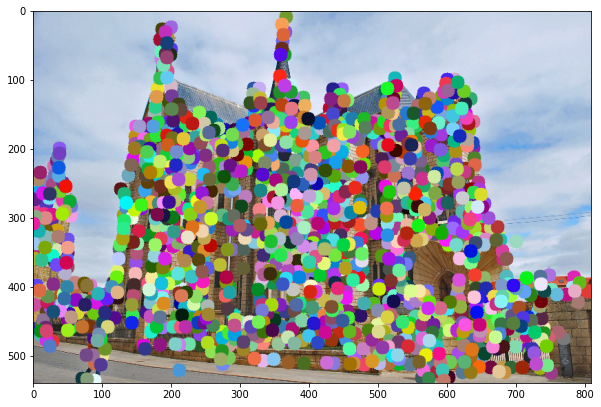

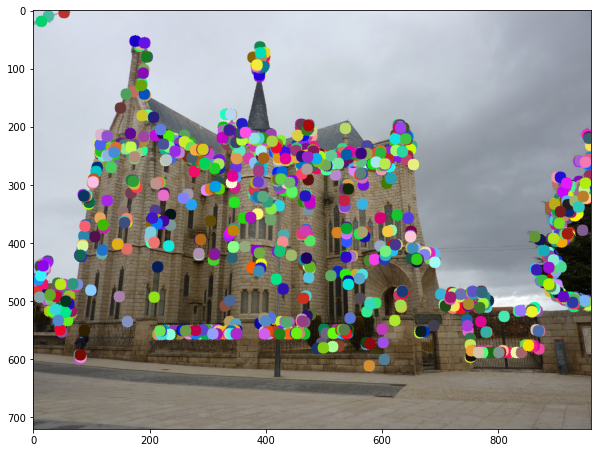

In [48]:
image1 = load_image('../data/Episcopal Gaudi/3743214471_1b5bbfda98_o.jpg')
image2 = load_image('../data/Episcopal Gaudi/4386465943_8cf9776378_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=0.6, fy=0.6)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(810, 540)
(960, 720)
(51, 1)
(51, 2)
51 matches from 1500 corners


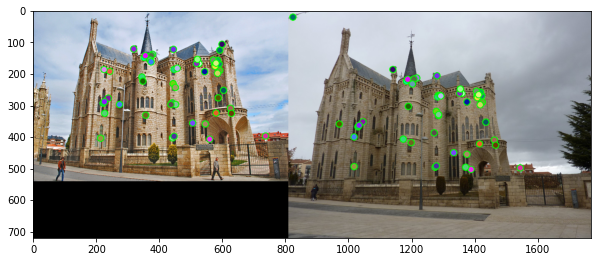

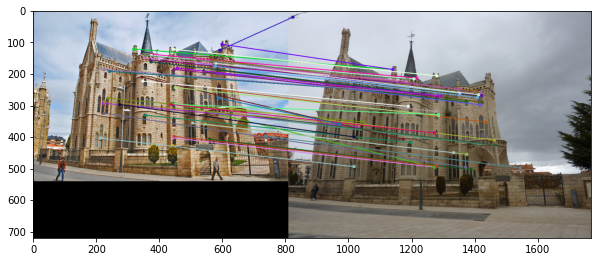

In [49]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_gaudi.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_gaudi.jpg', dpi=1000)


### House

720.0
[720.          1.        377.8954882 ...   1.          1.
   1.       ]
[1947 2491 2492 ...   26    2    0]
720.0
[720.         292.38502014   2.23606798 ...   1.           1.41421356
   1.        ]
[1833 2304 2305 ...   40    1    0]
1500 corners in image 1, 1500 corners in image 2


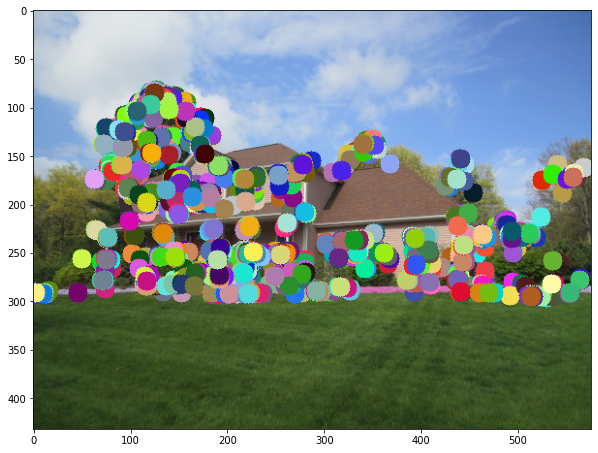

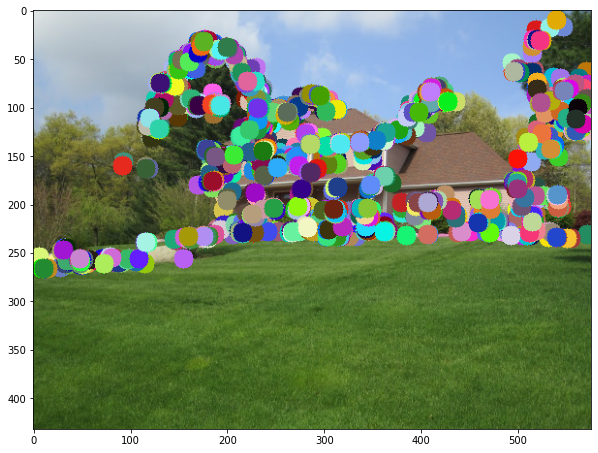

In [50]:
image1 = load_image('../data/House/IMG_0485.JPG')
image2 = load_image('../data/House/IMG_0488.JPG')
scale_factor = 0.5
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(576, 432)
(576, 432)
(199, 1)
(199, 2)
199 matches from 1500 corners


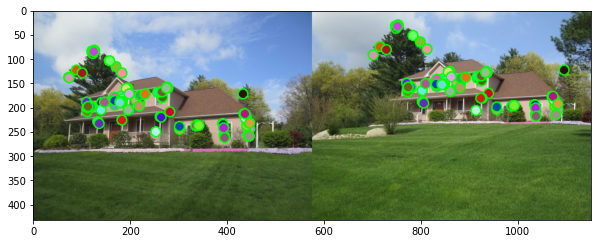

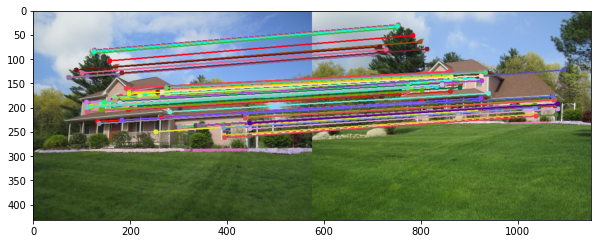

In [51]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_house.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_house.jpg', dpi=1000)


### Capricho Gaudi

1152.200069432388
[1.15220007e+03 1.00000000e+00 4.00124980e+01 ... 1.00000000e+00
 1.00000000e+00 1.00000000e+00]
[4480 5685 5683 ...  114   52    0]
1152.200069432388
[1.15220007e+03 1.96468827e+01 2.60863949e+02 ... 1.00000000e+00
 5.00000000e+00 1.00000000e+00]
[ 8530 10747 10751 ...    12    14     0]
1500 corners in image 1, 1500 corners in image 2


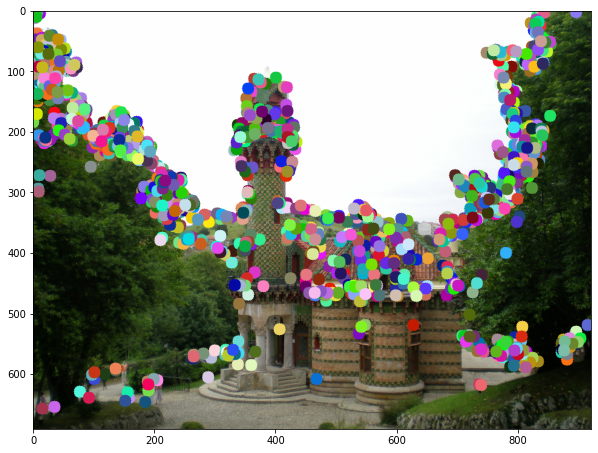

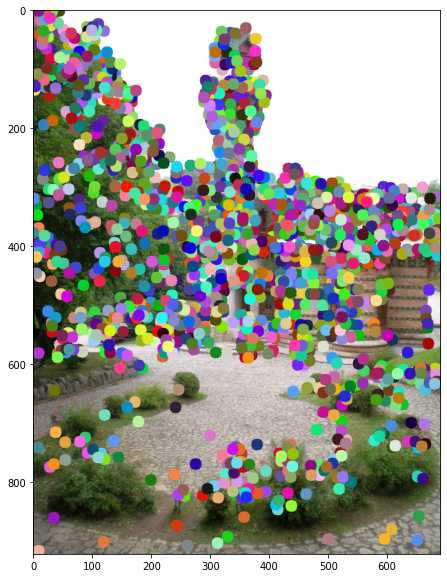

In [52]:
image1 = load_image('../data/Capricho Gaudi/3872126052_0e08c5a830_o.jpg')
image2 = load_image('../data/Capricho Gaudi/3872129062_9a1b8c98d7_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(922, 691)
(691, 922)
(108, 1)
(108, 2)
108 matches from 1500 corners


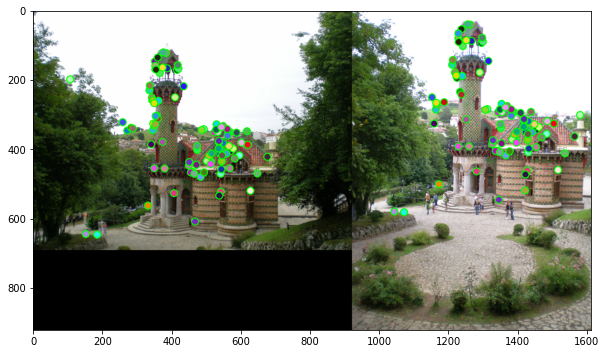

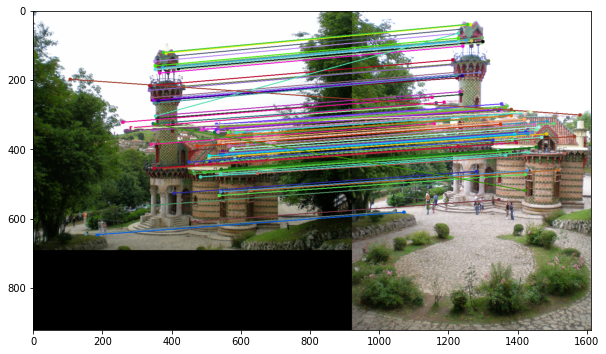

In [53]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_capricho.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_capricho.jpg', dpi=1000)


## Patheon Paris

918.2902591228984
[918.29025912 478.55302736   1.         ...   1.           1.
   2.        ]
[3874 4241 6744 ...    6    1    0]
931.3431161500041
[931.34311615   1.           1.         ...   3.60555128   1.
   1.        ]
[6990 3887 3886 ...   46   27    0]
1500 corners in image 1, 1500 corners in image 2


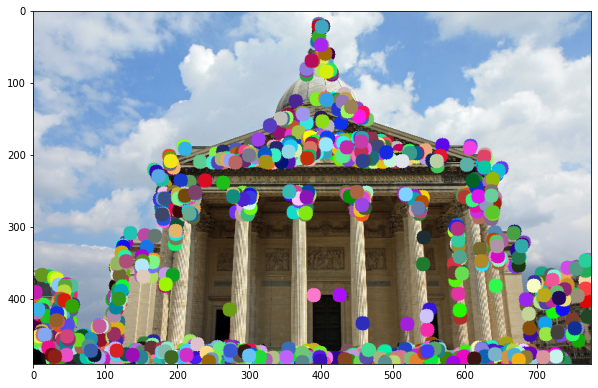

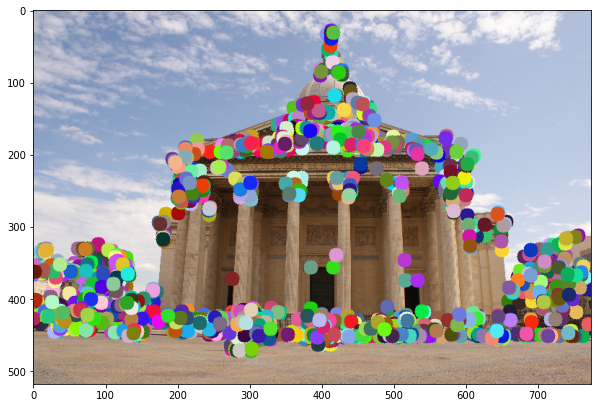

In [54]:
image1 = load_image('../data/Pantheon Paris/4872728253_3e73bd436b_o.jpg')
image2 = load_image('../data/Pantheon Paris/6005180348_c465ccf905_o.jpg')
scale_factor = 0.2
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(776, 491)
(774, 518)
(144, 1)
(144, 2)
144 matches from 1500 corners


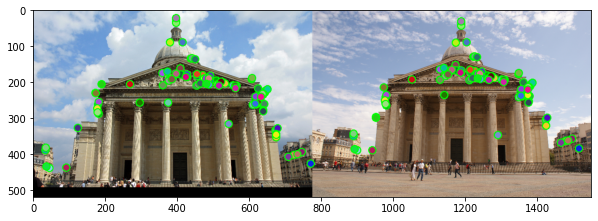

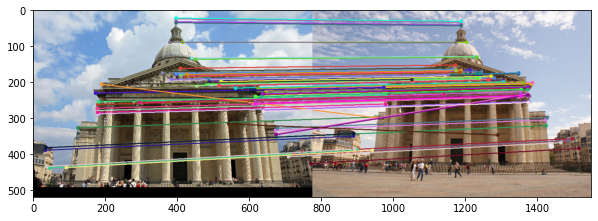

In [55]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_pantheon.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_pantheon.jpg', dpi=1000)


### Statue of Liberty

1246.134021684666
[1.24613402e+03 1.00000000e+00 1.00000000e+00 ... 1.00000000e+00
 1.00000000e+00 1.00000000e+00]
[1771 2234 2235 ...    6   10    0]
1246.134021684666
[1.24613402e+03 6.02079729e+01 1.00000000e+00 ... 2.00000000e+00
 1.00000000e+00 1.00000000e+00]
[ 819 1045 1044 ...   15   26    0]
1500 corners in image 1, 1500 corners in image 2


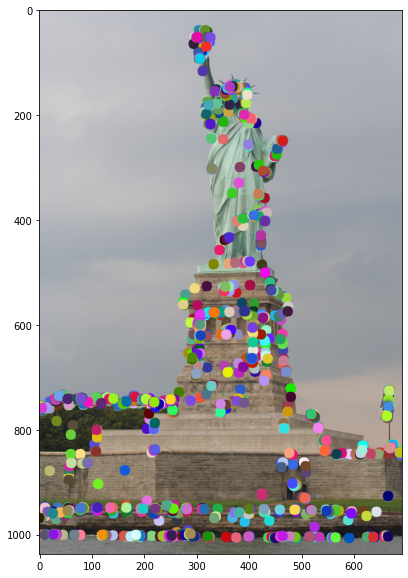

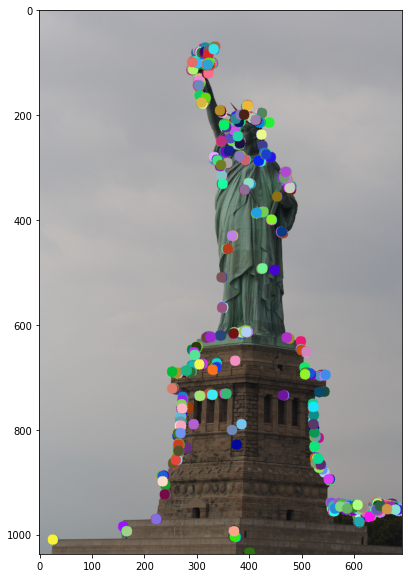

In [56]:
image1 = load_image('../data/Statue of Liberty/3055952595_24d4afe660_o.jpg')
image2 = load_image('../data/Statue of Liberty/3056777454_f9d7c29923_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(691, 1037)
(691, 1037)
(14, 1)
(14, 2)
14 matches from 1500 corners


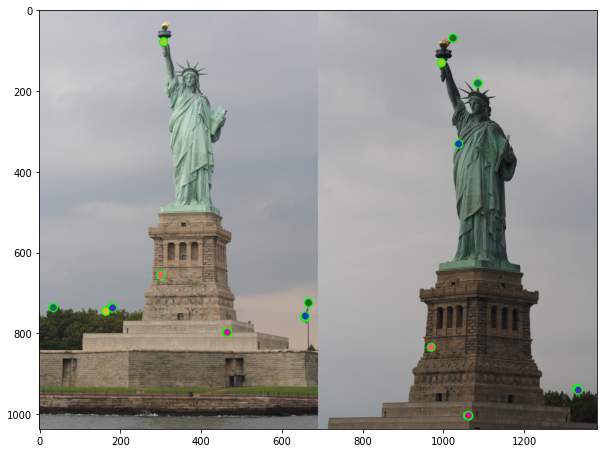

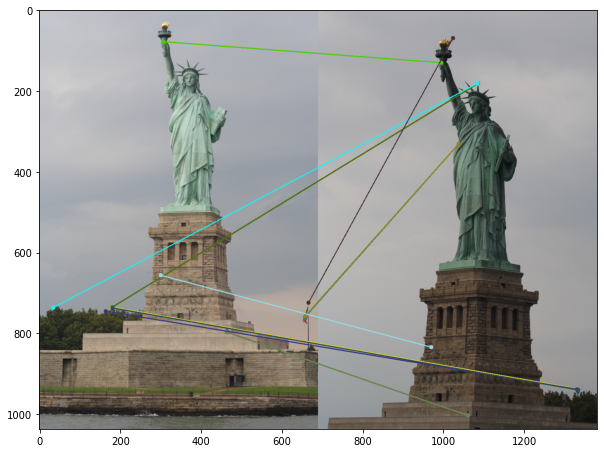

In [57]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_statue.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_statue.jpg', dpi=1000)


### Sleeping Beauty Castle

1146.4000174459175
[1.14640002e+03 1.00000000e+00 7.07106781e+00 ... 1.00000000e+00
 1.00000000e+00 1.00000000e+00]
[9395 4968 4967 ...   27   11    0]
1146.4000174459175
[1.14640002e+03 8.06225775e+00 7.21110255e+00 ... 3.00000000e+00
 1.00000000e+00 1.00000000e+00]
[4040 5141 5140 ...   13   28    0]
1500 corners in image 1, 1500 corners in image 2


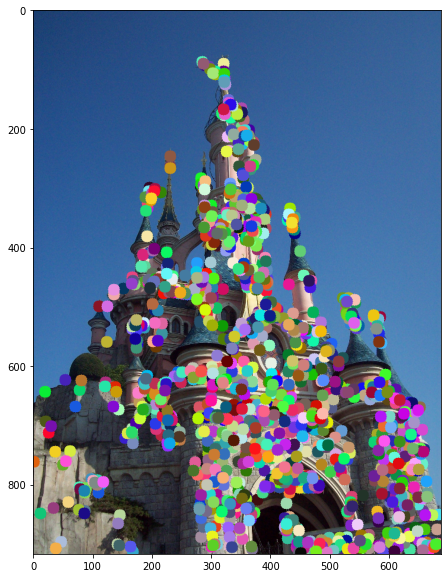

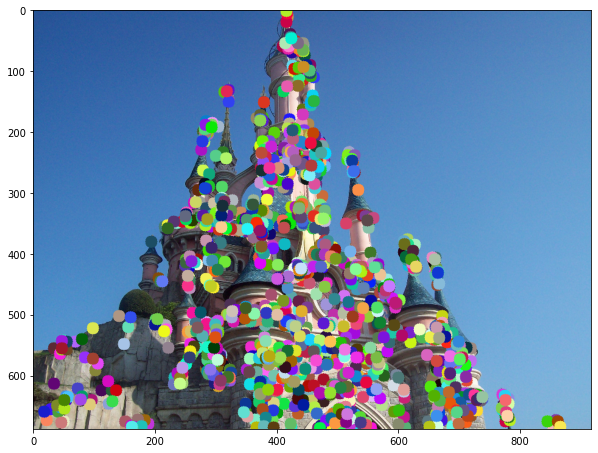

In [58]:
image1 = load_image(
    '../data/Sleeping Beauty Castle Paris/4893248701_f046f63c48_o.jpg')
image2 = load_image(
    '../data/Sleeping Beauty Castle Paris/4893249735_46343d0dd2_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=scale_factor, fy=scale_factor)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(688, 917)
(917, 688)
(780, 1)
(780, 2)
780 matches from 1500 corners


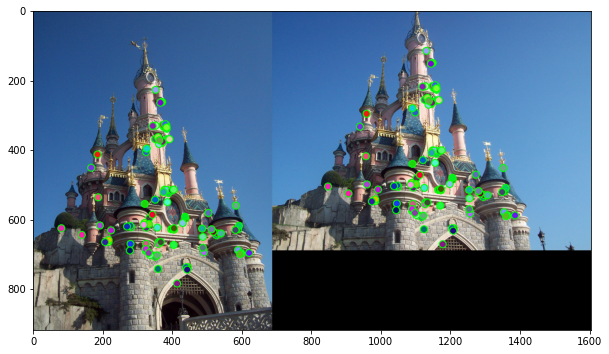

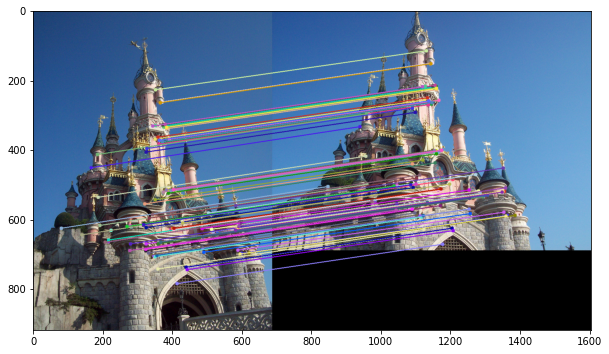

In [59]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_sleeping.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_sleeping.jpg', dpi=1000)


### Sacre Coeur

1398.401945078739
[1.39840195e+03 1.00000000e+00 1.00000000e+00 ... 1.00000000e+00
 1.00000000e+00 1.00000000e+00]
[ 9611 12309 12310 ...     5  3510     0]
1000.0
[1000.          218.02064122    1.         ...    1.            1.
    1.        ]
[15926  8701  8702 ...    36     1     0]
1500 corners in image 1, 1500 corners in image 2


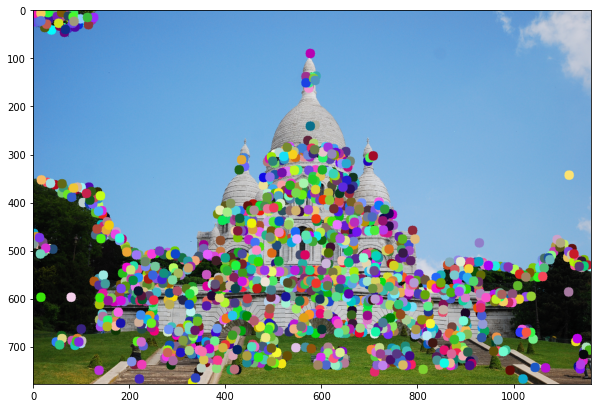

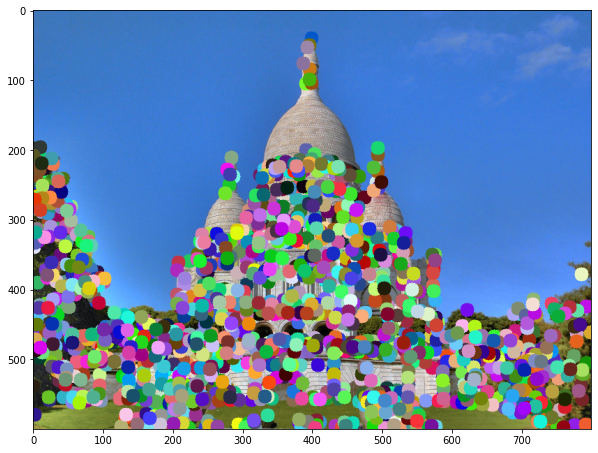

In [60]:
image1 = load_image('../data/Sacre Coeur/2589974552_c6e14695b2_o.jpg')
image2 = load_image('../data/Sacre Coeur/2647951094_d850360ce4_o.jpg')
scale_factor = 0.3
image1 = cv2.resize(image1, (0, 0), fx=scale_factor, fy=scale_factor)
image2 = cv2.resize(image2, (0, 0), fx=0.5, fy=0.5)
image1_bw = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
image2_bw = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

x1, y1, _, scales1, _ = get_interest_points(image1_bw, feature_width)
x2, y2, _, scales2, _ = get_interest_points(image2_bw, feature_width)
# x1, y1, x2, y2 = cheat_interest_points(
#     eval_file, 1)
# plt.figure(); plt.imshow(image1_bw)

# Visualize the interest points
c1 = show_interest_points(image1, x1, y1)
c2 = show_interest_points(image2, x2, y2)
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.figure(figsize=(10, 10))
plt.imshow(c2)
print('{:d} corners in image 1, {:d} corners in image 2'.format(len(x1), len(x2)))


(1162, 778)
(800, 600)
(21, 1)
(21, 2)
21 matches from 1500 corners


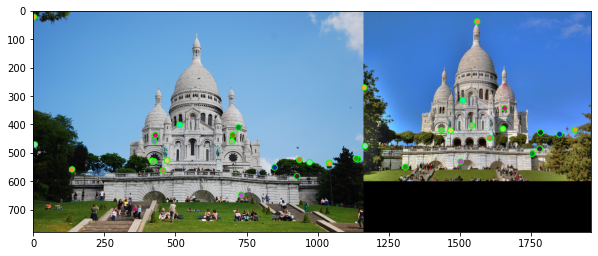

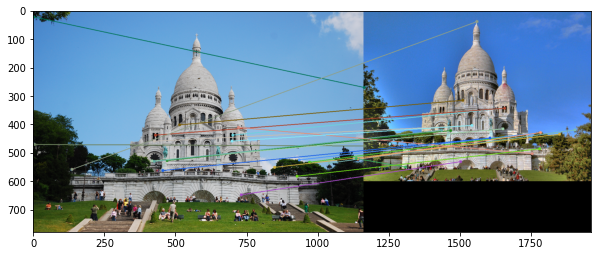

In [61]:
from utils import show_correspondence_circles, show_correspondence_lines
image1_features = get_features(image1_bw, x1, y1, feature_width, scales1)
image2_features = get_features(image2_bw, x2, y2, feature_width, scales2)
matches, confidences = match_features(
    image1_features, image2_features, x1, y1, x2, y2)
print('{:d} matches from {:d} corners'.format(len(matches), len(x1)))
# num_pts_to_visualize = len(matches)
num_pts_to_visualize = 100
c1 = show_correspondence_circles(image1, image2,
                                 x1[matches[:num_pts_to_visualize, 0]
                                    ], y1[matches[:num_pts_to_visualize, 0]],
                                 x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c1)
plt.savefig('../results/vis_circles_sacre.jpg', dpi=1000)
c2 = show_correspondence_lines(image1, image2,
                               x1[matches[:num_pts_to_visualize, 0]
                                  ], y1[matches[:num_pts_to_visualize, 0]],
                               x2[matches[:num_pts_to_visualize, 1]], y2[matches[:num_pts_to_visualize, 1]])
plt.figure(figsize=(10, 10))
plt.imshow(c2)
plt.savefig('../results/vis_lines_sacre.jpg', dpi=1000)
